In [25]:
import pandas as pd
import numpy as np
%matplotlib inline
!pip install cartopy

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap



[notice] A new release of pip is available: 24.0 -> 26.2
[notice] To update, run: pip install --upgrade pip


In [27]:
#aurora_df = pd.read_csv("web_observations_2014-08-01_to_2025-08-02_cleaned.csv")
aurora_df = pd.read_csv("data/Aurorasaurus/aurorasaurus_observations_2014-2025.csv")

print("Columns:", aurora_df.columns)
aurora_df.head()

Columns: Index(['raw_row_num', 'obs_id', 'activities_id', 'height_id', 'sky_id',
       'observer_id', 'timestamp', 'address_country', 'address_state',
       'location', 'see_aurora', 'sky_other', 'time_start', 'time_end',
       'on_going', 'height_other', 'activities_other', 'colors_other',
       'types_other', 'comment', 'image', 'st_y', 'st_x', 'colors', 'types',
       'image_url', 'small_image_url', 'redact_row', 'pii_redacted',
       'duration', 'mlat', 'mlon', 'mlt'],
      dtype='object')


,raw_row_num,obs_id,activities_id,height_id,sky_id,observer_id,timestamp,address_country,address_state,location,...,colors,types,image_url,small_image_url,redact_row,pii_redacted,duration,mlat,mlon,mlt
0,1,7372c36fe0c7,NaN,NaN,NaN,117.0,2014-10-01 08:21:34.818216+00:00,United Arab Emirates,Dubai,SRID=4326;POINT (55.154846755193745 25.0416718...,...,NaN,NaN,NaN,NaN,False,False,0.25,19.985358,128.137506,12.129542
1,3,07c100d1ef09,NaN,NaN,clea,NaN,2014-10-02 13:47:29.552583+00:00,United States,NM,SRID=4326;POINT (-106.31864826448822 35.874131...,...,NaN,NaN,NaN,NaN,False,False,0.25,44.155324,-39.100305,6.438991
2,6,90f6d683296b,quie,n,NaN,140.0,2014-10-08 18:09:23.114761+00:00,United States,NM,SRID=4326;POINT (-106.0875978020242 35.9777940...,...,"red, whit",arcs,NaN,NaN,False,False,0.25,44.298471,-38.831876,10.782292
3,7,e6ffd03f4085,very,n45,NaN,141.0,2014-10-08 18:11:38.395952+00:00,United States,NM,SRID=4326;POINT (-106.33536318032095 35.858267...,...,gree,"glow, patc",NaN,NaN,False,False,0.25,44.136071,-39.115849,10.763361
4,8,a67afd419547,acti,over,NaN,141.0,2014-10-08 18:15:51.473713+00:00,United States,NM,SRID=4326;POINT (-106.3362134605038 35.8694066...,...,"whit, gree, pink","arcs, glow",NaN,NaN,False,False,0.25,44.147181,-39.118361,10.763193


In [29]:
columns = ["timestamp", "st_y", "st_x", "mlat", "mlon", "mlt", "see_aurora"]
cleaned_aurora_df = aurora_df[columns]
cleaned_aurora_df = cleaned_aurora_df.rename(
    columns={"st_y": "lat", 
             "st_x": "lon",
             "mlat": "mag_lat",
             "mlon": "mag_lon",
             "mlt": "mag_lt",
             "see_aurora": "aurora_observed"}
    )
cleaned_aurora_df.head()

,timestamp,lat,lon,mag_lat,mag_lon,mag_lt,aurora_observed
0,2014-10-01 08:21:34.818216+00:00,25.041672,55.154847,19.985358,128.137506,12.129542,False
1,2014-10-02 13:47:29.552583+00:00,35.874132,-106.318648,44.155324,-39.100305,6.438991,False
2,2014-10-08 18:09:23.114761+00:00,35.977794,-106.087598,44.298471,-38.831876,10.782292,True
3,2014-10-08 18:11:38.395952+00:00,35.858267,-106.335363,44.136071,-39.115849,10.763361,True
4,2014-10-08 18:15:51.473713+00:00,35.869407,-106.336213,44.147181,-39.118361,10.763193,True


In [31]:
cleaned_aurora_df.isna().sum()

timestamp           0
lat                 0
lon                 0
mag_lat            16
mag_lon            16
mag_lt             16
aurora_observed     0
dtype: int64

In [33]:
cleaned_aurora_df = cleaned_aurora_df.dropna()
len(cleaned_aurora_df)

22264

## Working With Folium

In [35]:
!pip install folium

import folium


[notice] A new release of pip is available: 24.0 -> 26.2
[notice] To update, run: pip install --upgrade pip


In [37]:
# Initialize interactive map centered around an average location
# Using the standard geographic 'lat' and 'lon' columns
start_lat = cleaned_aurora_df['lat'].mean()
start_lon = cleaned_aurora_df['lon'].mean()
m = folium.Map(location=[start_lat, start_lon], zoom_start=3, tiles="OpenStreetMap")

In [39]:
#Loop through the dataframe and add points
for idx, row in cleaned_aurora_df.iterrows():
    # Set color: Green if aurora was seen, Red if not
    color = "green" if row['aurora_observed'] else "red"
    
    # Create a descriptive popup
    popup_text = f"""
    <b>Timestamp:</b> {row['timestamp']}<br>
    <b>Aurora Observed:</b> {row['aurora_observed']}<br>
    <b>Mag Lat:</b> {row['mag_lat']:.2f}<br>
    <b>Mag LT:</b> {row['mag_lt']:.2f}
    """
    
    # Add a circle marker for each data point
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=6,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=folium.Popup(popup_text, max_width=300)
    ).add_to(m)

# Display the map 
m
m.save("aurora_map.html")
# To save it as an HTML file, use: m.save("aurora_map.html")

In [41]:
# Force VS Code to render the HTML object
from IPython.display import display, HTML
#display(HTML(m._repr_html_()))

In [43]:
from folium.plugins import TimestampedGeoJson

# Initialize map
m = folium.Map(location=[35, -100], zoom_start=3)

In [45]:
# Format  data into a GeoJSON feature list that Folium's slider understands
features = []
for idx, row in cleaned_aurora_df.iterrows():
    color = "green" if row['aurora_observed'] else "red"
    
    feature = {
        'type': 'Feature',
        'geometry': {
            'type': 'Point',
            'coordinates': [row['lon'], row['lat']]  # GeoJSON expects [lon, lat]
        },
        'properties': {
            # This is the crucial part: it attaches a strict ISO string timestamp to the point
            'time': row['timestamp'].isoformat() if hasattr(row['timestamp'], 'isoformat') else str(row['timestamp']),
            'style': {'color': color, 'fillColor': color},
            'icon': 'circle',
            'iconstyle': {
                'fillColor': color,
                'fillOpacity': 0.7,
                'stroke': 'true',
                'radius': 6
            },
            'popup': f"Observed: {row['aurora_observed']}"
        }
    }
    features.append(feature)

In [47]:

# Create the GeoJSON structure
geojson_data = {
    'type': 'FeatureCollection',
    'features': features
}

In [49]:

#add the TimeSlider plugin to the map
TimestampedGeoJson(
    geojson_data,
    period='PT1H', # step size (e.g., 'PT1H' for 1 hour, 'P1D' for 1 day)
    add_last_point=True,
    auto_play=False,
    loop=False,
    max_speed=1,
    loop_button=True,
    date_options='YYYY-MM-DD HH:mm:ss',
    time_slider_drag_update=True
).add_to(m)

# Display the map
from IPython.display import display, HTML
display(HTML(m._repr_html_()))

In [51]:
# Tell pandas to dynamically handle mixed-precision ISO8601 strings
cleaned_aurora_df['timestamp'] = pd.to_datetime(cleaned_aurora_df['timestamp'], format='ISO8601')

# Initialize map with a  DARK basemap 
# We center it generally over North America/Global mid-to-high latitudes
m = folium.Map(
    location=[45.0, -90.0], 
    zoom_start=3, 
    tiles="CartoDB dark_matter", # Dark theme makes the lime-green and red pop beautifully
    attr="&copy; OpenStreetMap contributors &copy; CartoDB"
)

# GeoJSON features
features = []
for idx, row in cleaned_aurora_df.iterrows():
    # neon colors
    color = "#00FF66" if row['aurora_observed'] else "#FF3333"
    
    # Clean up the timestamp for display in the popup
    time_str = row['timestamp'].strftime('%Y-%m-%d %H:%M:%S')
    
    feature = {
        'type': 'Feature',
        'geometry': {
            'type': 'Point',
            'coordinates': [row['lon'], row['lat']]
        },
        'properties': {
            # Provide ISO format to the timeline slider
            'time': row['timestamp'].isoformat(),
            'style': {'color': color, 'fillColor': color},
            'icon': 'circle',
            'iconstyle': {
                'fillColor': color,
                'fillOpacity': 0.8,
                'stroke': 'true',
                'color': '#ffffff', # White border around dots makes them sharp
                'weight': 1,
                'radius': 8 # Slightly larger marker for better visibility
            },
            'popup': f"""
            <div style="font-family: sans-serif; min-width: 150px;">
                <h4 style="margin:0 0 5px 0; color:{color};">
                    {'Aurora Detected!' if row['aurora_observed'] else 'No Aurora'}
                </h4>
                <b>Time:</b> {time_str}<br>
                <b>Mag Lat:</b> {row['mag_lat']:.2f}°
            </div>
            """
        }
    }
    features.append(feature)

geojson_data = {
    'type': 'FeatureCollection',
    'features': features
}

# 3. Add the highly configured TimeSlider plugin
TimestampedGeoJson(
    geojson_data,
    period='PT6H',                        # Steps forward every 6 hours (change to 'P1D' for daily steps)
    add_last_point=True,                 # Keeps the previous points visible briefly
    transition_time=400,                 # Smoothness of transition in milliseconds
    auto_play=False,
    loop=False,
    max_speed=2,                         # Playback speed multiplier
    loop_button=True,
    date_options='YYYY-MM-DD HH:mm',     # Clean layout for the clock display
    time_slider_drag_update=True
).add_to(m)

# 4. Display the map in VS Code
from IPython.display import display, HTML
#display(HTML(m._repr_html_()))
#EXCEEDS DEEPNOTES 30MB LIMIT

Once the regression model is made, we can pass the spatial dataset through it to generate an aurora probability score (from 0\% to 100\%) for every coordinate over time. We can map  continuous probabilities onto a dynamic color gradient-like transitioning from deep red for low probability to a vibrant neon green for high likelihood

while scaling the map marker sizes so that high-confidence predictions physically pop out on the timeline

visually track the movement and expansion of the auroral oval directly against real-world ground truth data as the time slider moves

## working with Cartopy

In [53]:
!pip install cartopy

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature


[notice] A new release of pip is available: 24.0 -> 26.2
[notice] To update, run: pip install --upgrade pip


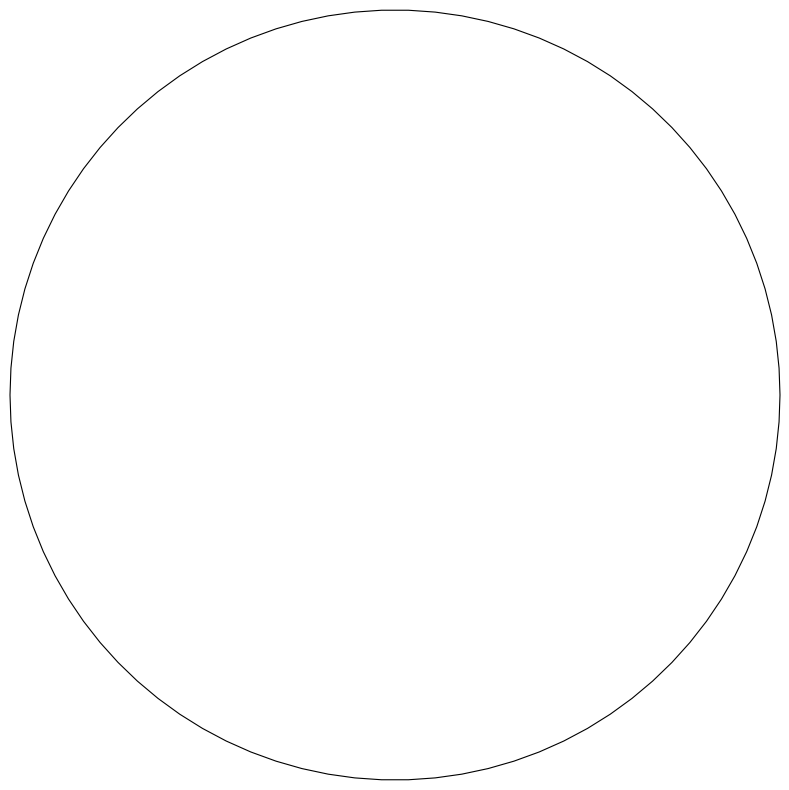

In [55]:


# Create a figure and set a Polar Stereographic projection centered on the North Pole
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=-90))

In [57]:
# add geographical features (land, oceans, coastlines)
ax.add_feature(cfeature.OCEAN, facecolor='#111625')  # Dark ocean
ax.add_feature(cfeature.LAND, facecolor='#242936', edgecolor='#404756')  # Dark land
ax.add_feature(cfeature.COASTLINE, edgecolor='#525c70', linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='#404756')

In [59]:
# **** restrict the map view to the northern hemisphere (e.g., lat 30 to 90)
# Otherwise, a polar map tries to show the whole world and looks like a giant circle
ax.set_extent([-180, 180, 30, 90], crs=ccrs.PlateCarree())

In [61]:

# Separate  data into True/False observations for distinct styling
observed = cleaned_aurora_df[cleaned_aurora_df['aurora_observed'] == True]
not_observed = cleaned_aurora_df[cleaned_aurora_df['aurora_observed'] == False]

In [63]:
# Plot the data points
# data coordinates are still standard Lat/Lon.
#  MUST tell Cartopy this by passing transform=ccrs.PlateCarree()
ax.scatter(
    not_observed['lon'], not_observed['lat'], 
    color='#FF3333', marker='x', s=40, label='No Aurora',
    transform=ccrs.PlateCarree(), zorder=3
)

ax.scatter(
    observed['lon'], observed['lat'], 
    color='#00FF66', marker='o', s=60, edgecolor='white', linewidth=0.5, label='Aurora Observed',
    transform=ccrs.PlateCarree(), zorder=4
)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


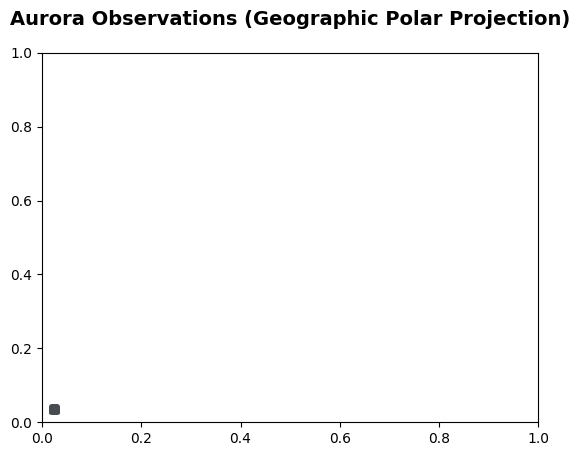

In [65]:

# add gridlines, a title, and a legend
ax.gridlines(draw_labels=True, dms=True, color='#313745', linestyle='--')
plt.title("Aurora Observations (Geographic Polar Projection)", fontsize=14, pad=20, fontweight='bold')
plt.legend(loc='lower left', frameon=True, facecolor='#1a1e24', edgecolor='none', labelcolor='white')

plt.show()

/root/venv/lib/python3.11/site-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/root/venv/lib/python3.11/site-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/root/venv/lib/python3.11/site-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/root/venv/lib/python3.11/site-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


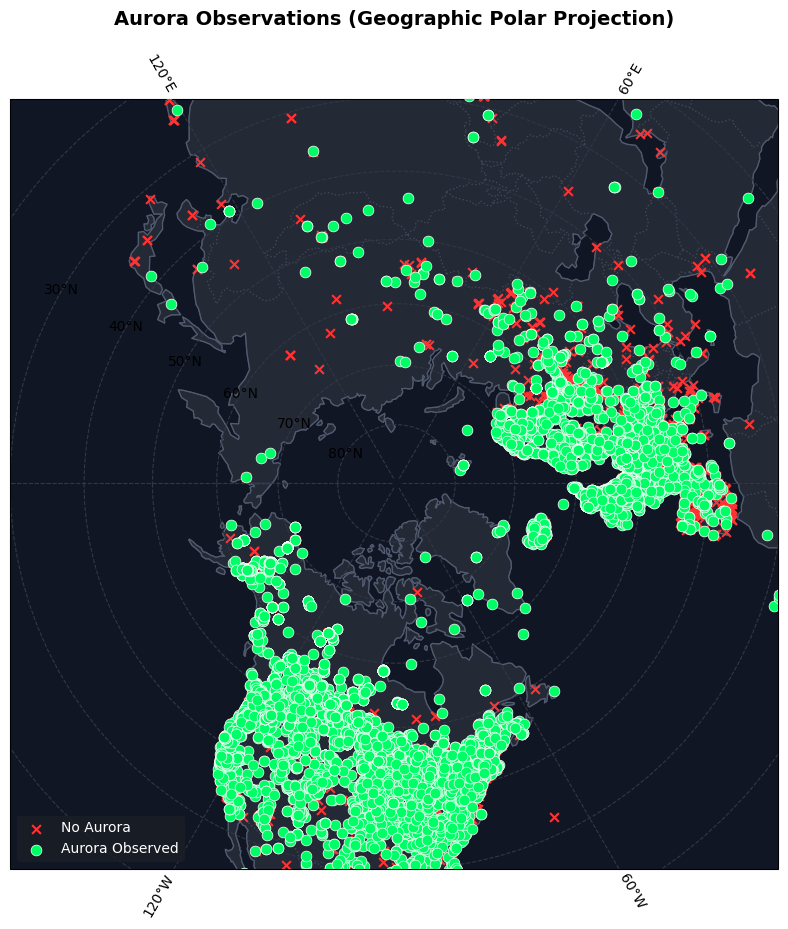

In [67]:
#Putting everything in one cell
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=-90))

# Add geographical features
ax.add_feature(cfeature.OCEAN, facecolor='#111625')  
ax.add_feature(cfeature.LAND, facecolor='#242936', edgecolor='#404756')  
ax.add_feature(cfeature.COASTLINE, edgecolor='#525c70', linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='#404756')

# Restrict map view to the northern hemisphere
ax.set_extent([-180, 180, 30, 90], crs=ccrs.PlateCarree())
observed = cleaned_aurora_df[cleaned_aurora_df['aurora_observed'] == True]
not_observed = cleaned_aurora_df[cleaned_aurora_df['aurora_observed'] == False]

ax.scatter(
    not_observed['lon'], not_observed['lat'], 
    color='#FF3333', marker='x', s=40, label='No Aurora',
    transform=ccrs.PlateCarree(), zorder=3
)

ax.scatter(
    observed['lon'], observed['lat'], 
    color='#00FF66', marker='o', s=60, edgecolor='white', linewidth=0.5, label='Aurora Observed',
    transform=ccrs.PlateCarree(), zorder=4
)

ax.gridlines(draw_labels=True, dms=True, color='#313745', linestyle='--')
plt.title("Aurora Observations (Geographic Polar Projection)", fontsize=14, pad=20, fontweight='bold')
plt.legend(loc='lower left', frameon=True, facecolor='#1a1e24', edgecolor='none', labelcolor='white')

plt.show()

## Implementing KP onto Maps

In [23]:
from matplotlib.colors import LinearSegmentedColormap


In [24]:

#example kp prediction
forecast_kp = 2

# equatorward edge based on the empirical Kp formula
#https://www.spaceweather.gov/content/tips-viewing-aurora

equatorward_edge = 66.0 - (2.0 * forecast_kp)

# peak intensity of the aurora is a few degrees poleward of the absolute edge
peak_lat = equatorward_edge + 4.0 

In [25]:

# make up a grid of geographic latitudes and longitudes
lons = np.linspace(-180, 180, 360)
#3below only uses nothern hemisphere
lats = np.linspace(30, 90, 180)
lon2d, lat2d = np.meshgrid(lons, lats)

# Create a Gaussian ring centered around the calculated peak_lat
# (For a perfectly accurate map, geographic coordinates should first be rotated to geomagnetic coordinates)
std_dev = 3.5 # Controls how wide the  band spreads
probability_grid = np.exp(-0.5 * ((lat2d - peak_lat) / std_dev)**2)

### Currently, the probability grid centers on the geographic North Pole.
 The true auroral oval centers on the Earth's magnetic pole. 

 wya to do this:
 1. use the `aacgmv2` library (Altitude Adjusted Corrected Geomagnetic Coordinates).
 2. convert the geographic `lon2d` and `lat2d` meshgrid arrays into magnetic coordinates
 3. calc the Gaussian probability distribution using the new magnetic latitudes
 4. Plot the grid using Cartopy's PlateCarree transform as usual.

ALSO need to make the band change sizes? Thicker when kp is larger (??)

In [26]:

# fades from fully transparent (0% probability) to neon green, 
# and eventually to a deep red at the absolute highest intensities.
colors = [
    (0.0, 0.0, 0.0, 0.0),      # Transparent (Background)
    (0.0, 1.0, 0.4, 0.4),      # Translucent Neon Green (Low Probability)
    (0.0, 1.0, 0.4, 0.9),      # Solid Neon Green (High Probability)
    (0.8, 0.0, 1.0, 1.0)       # Bright Purple (Peak Intensity)
]
aurora_cmap = LinearSegmentedColormap.from_list("aurora", colors)

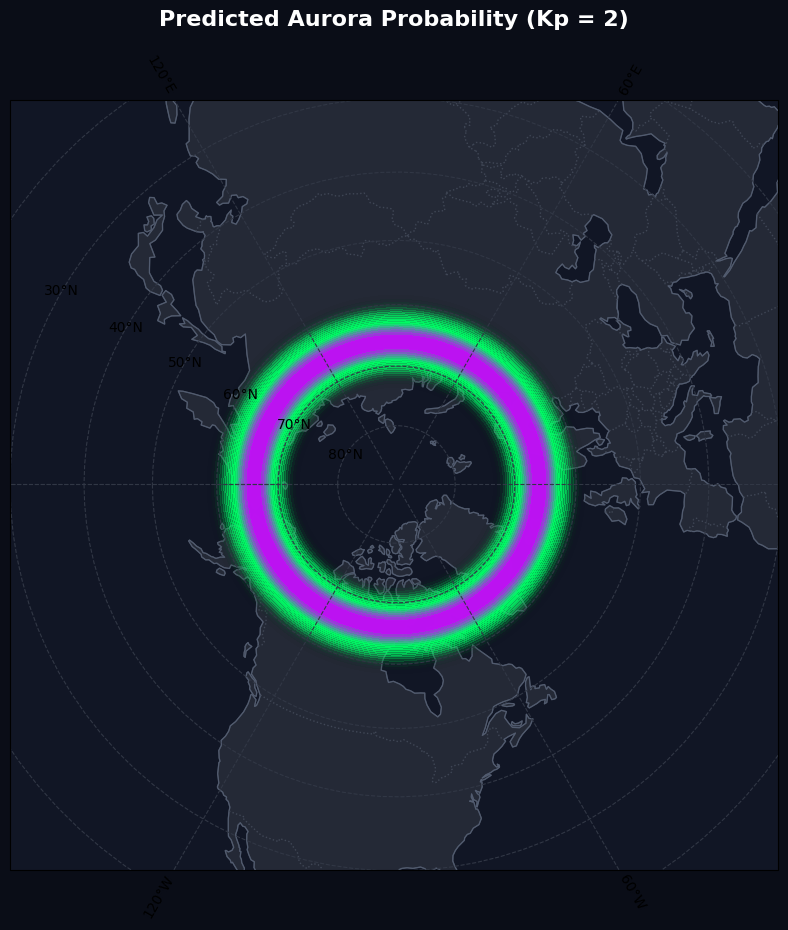

In [27]:

fig = plt.figure(figsize=(10, 10))
# dark backrgound
fig.patch.set_facecolor('#0a0d17') 

ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=-90))

ax.add_feature(cfeature.OCEAN, facecolor="#111625")
ax.add_feature(cfeature.LAND, facecolor="#242936", edgecolor="#404756")
ax.add_feature(cfeature.COASTLINE, edgecolor="#525c70", linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linestyle=":", edgecolor="#404756")

# northern hemisphere
ax.set_extent([-180, 180, 30, 90], crs=ccrs.PlateCarree())


#  ax.contourf() plot the continuous probability grid
#  "transform=ccrs.PlateCarree()" argument is mandatory to map the raw lat/lon grid onto the polar projection
contour = ax.contourf(
    lon2d, lat2d, probability_grid, 
    levels=np.linspace(0.1, 1.0, 20), # Only draw contours for probabilities above 10%
    cmap=aurora_cmap, 
    transform=ccrs.PlateCarree(), 
    zorder=2
)

ax.gridlines(draw_labels=True, dms=True, color="#313745", linestyle="--")
plt.title(f"Predicted Aurora Probability (Kp = {forecast_kp})", fontsize=16, pad=20, fontweight="bold", color="white")

plt.show()

# Function to take everything above so any KP can be used

In [28]:

def predicted_kp_circle(forecast_kp):
    equatorward_edge = 66.0 - (2.0 * forecast_kp)

    # peak intensity of the aurora is a few degrees poleward of the absolute edge
    peak_lat = equatorward_edge + 4.0 

    # make up a grid of geographic latitudes and longitudes
    lons = np.linspace(-180, 180, 360)
    #3below only uses nothern hemisphere
    lats = np.linspace(30, 90, 180)
    lon2d, lat2d = np.meshgrid(lons, lats)
    
    # Create a Gaussian ring centered around the calculated peak_lat
    # (For a perfectly accurate map, geographic coordinates should first be rotated to geomagnetic coordinates)
    std_dev = 3.5 # Controls how wide the  band spreads
    probability_grid = np.exp(-0.5 * ((lat2d - peak_lat) / std_dev)**2)

    # fades from fully transparent (0% probability) to neon green, 
    # and eventually to a deep red at the absolute highest intensities.
    colors = [
        (0.0, 0.0, 0.0, 0.0),      # Transparent (Background)
        (0.0, 1.0, 0.4, 0.4),      # Translucent Neon Green (Low Probability)
        (0.0, 1.0, 0.4, 0.9),      # Solid Neon Green (High Probability)
        (0.8, 0.0, 1.0, 1.0)       # Bright Purple (Peak Intensity)
    ]
    aurora_cmap = LinearSegmentedColormap.from_list("aurora", colors)

    fig = plt.figure(figsize=(10, 10))
    # dark backrgound
    fig.patch.set_facecolor('#0a0d17') 
    
    ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=-90))
    
    ax.add_feature(cfeature.OCEAN, facecolor="#111625")
    ax.add_feature(cfeature.LAND, facecolor="#242936", edgecolor="#404756")
    ax.add_feature(cfeature.COASTLINE, edgecolor="#525c70", linewidth=0.8)
    ax.add_feature(cfeature.BORDERS, linestyle=":", edgecolor="#404756")
    
    # northern hemisphere
    ax.set_extent([-180, 180, 30, 90], crs=ccrs.PlateCarree())
    
    
    #  ax.contourf() plot the continuous probability grid
    #  "transform=ccrs.PlateCarree()" argument is mandatory to map the raw lat/lon grid onto the polar projection
    contour = ax.contourf(
        lon2d, lat2d, probability_grid, 
        levels=np.linspace(0.1, 1.0, 20), # Only draw contours for probabilities above 10%
        cmap=aurora_cmap, 
        transform=ccrs.PlateCarree(), 
        zorder=2
    )
    
    ax.gridlines(draw_labels=True, dms=True, color="#313745", linestyle="--")
    plt.title(f"Predicted Aurora Probability (Kp = {forecast_kp})", fontsize=16, pad=20, fontweight="bold", color="white")
    
    plt.show()

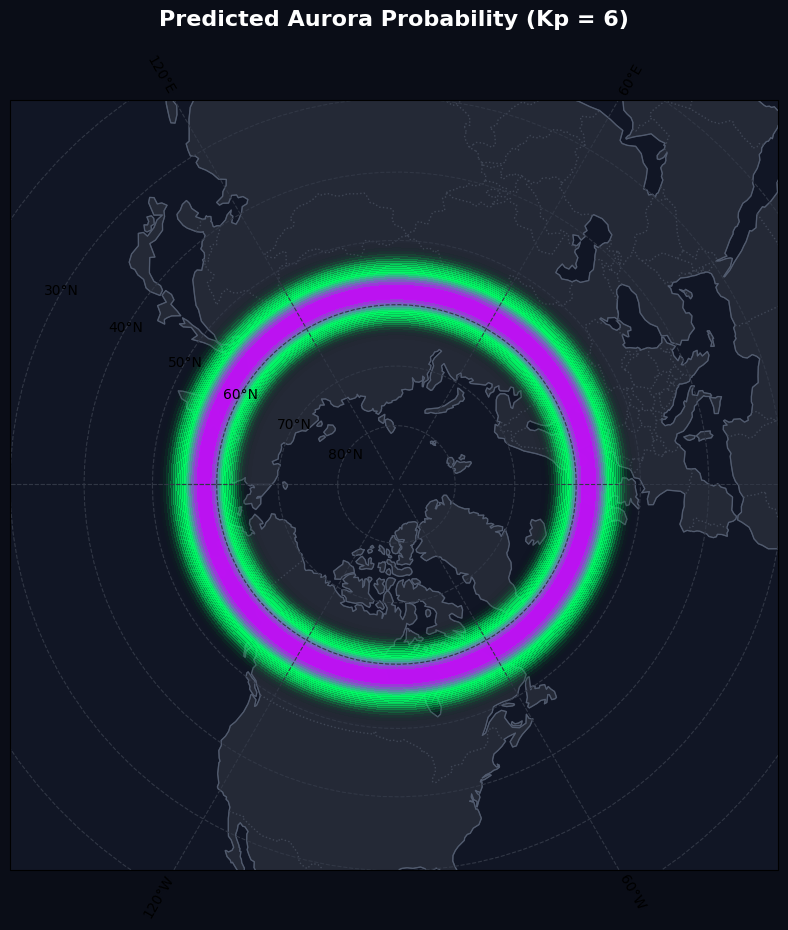

In [29]:
predicted_kp_circle(6)

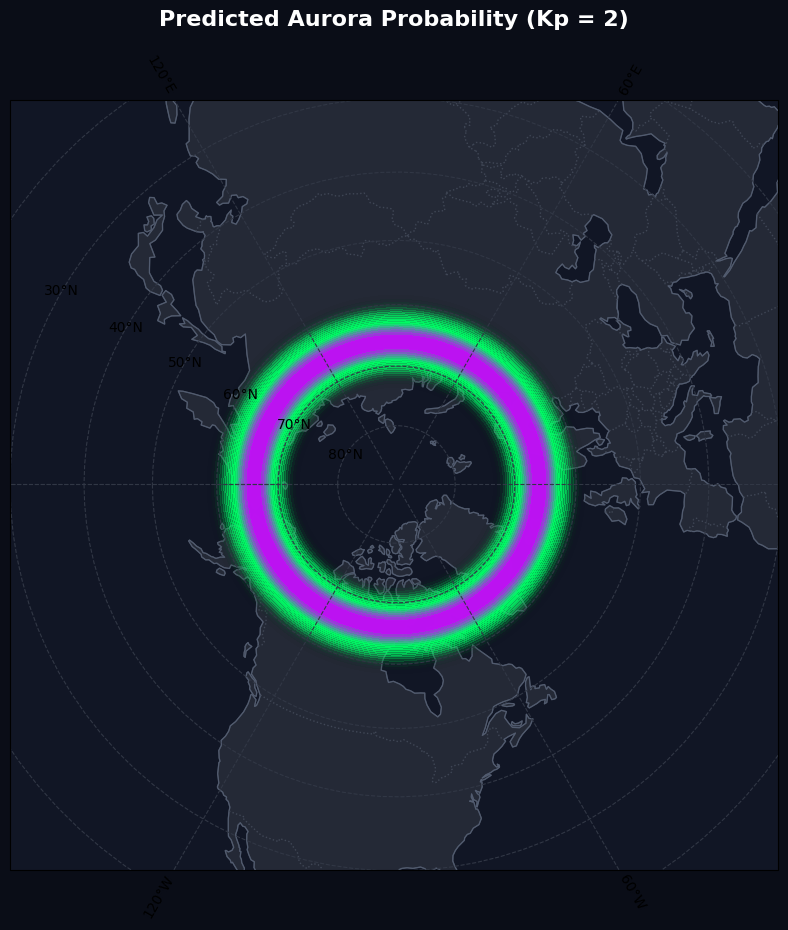

In [30]:
predicted_kp_circle(2)

## Some EDA

aurora_observed
True     73.477363
False    26.522637
Name: proportion, dtype: float64
/tmp/ipykernel_346/39462405.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=cleaned_aurora_df, x='aurora_observed', palette=['#FF3333', '#00FF66'])


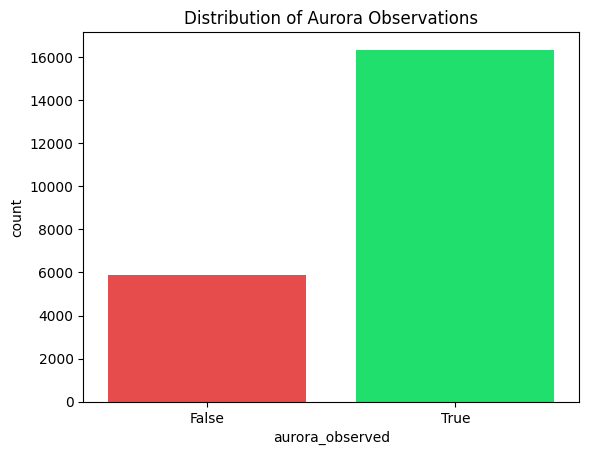

In [31]:
#  ratio of positive to negative observations
print(cleaned_aurora_df['aurora_observed'].value_counts(normalize=True) * 100)

import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(data=cleaned_aurora_df, x='aurora_observed', palette=['#FF3333', '#00FF66'])
plt.title("Distribution of Aurora Observations")
plt.show()

count    16359.000000
mean        50.006308
std         19.984777
min        -79.925832
25%         48.867902
50%         53.176767
75%         58.016564
max         83.213953
Name: mag_lat, dtype: float64


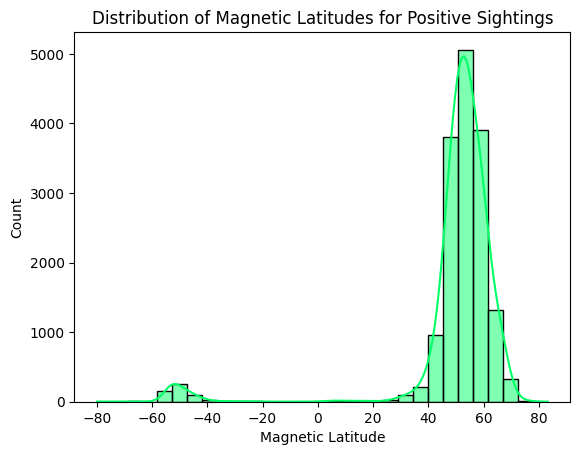

In [32]:
#  only successful sightings
positive_sightings = cleaned_aurora_df[cleaned_aurora_df['aurora_observed'] == True]

#  summary statistics for the magnetic latitude of positive sightings
print(positive_sightings['mag_lat'].describe())


sns.histplot(positive_sightings['mag_lat'], bins=30, kde=True, color="#00FF66")
plt.title("Distribution of Magnetic Latitudes for Positive Sightings")
plt.xlabel("Magnetic Latitude")
plt.show()

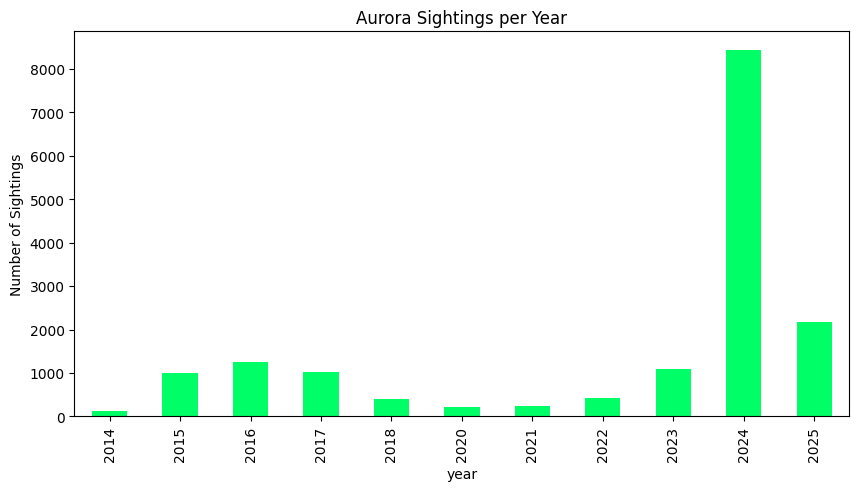

In [33]:
#  year from the timestamp
cleaned_aurora_df['year'] = cleaned_aurora_df['timestamp'].dt.year

# group by year and count positive sightings
yearly_counts = cleaned_aurora_df[cleaned_aurora_df['aurora_observed'] == True].groupby('year').size()

plt.figure(figsize=(10, 5))
yearly_counts.plot(kind='bar', color='#00FF66')
plt.title("Aurora Sightings per Year")
plt.ylabel("Number of Sightings")
plt.show()

## making the circle more of an oval

Instead of static base_peak_lat for the entire ring, using the day_night_lat_shift variable.

5.0 * np.cos(np.radians(lon2d - solar_lon))

Because a cosine wave fluctuates between 1 and -1, this formula pushes the auroral band up to 5 degrees further North (poleward) on the side of the Earth facing the sun, and pulls it 5 degrees further South (equatorward) on the nightside. This simulates the solar wind compressing the dayside magnetosphere.

______

The auroral oval is physically wider and more intense on the nightside of the Earth. I replaced a static standard deviation (which dictated the width of the Gaussian curve) with dynamic_std_dev.

3.5 - 1.5 * np.cos(np.radians(lon2d - solar_lon))

By subtracting the cosine wave, the standard deviation is maximized on the nightside (making the green band thicker and more diffuse) and minimized on the dayside (pinching the band into a thinner, tighter line).

______

The grid needed a reference point for where the sun is currently shining since is a rig fn

solar_lon = 0.0 (this will be changed by user input for time of day??)

This acts as the 0 for the dayside/nightside math. By setting it to the Prime Meridian for this example, the map knows exactly where to apply the squish(local noon) and where to apply the swell (midnight).


______

the standard probability formula was updated with the new vars

np.exp(-0.5 * ((lat2d - dynamic_peak_lat) / dynamic_std_dev)**2)

As NumPy calculates the grid, it dynamically checks the longitude of every single pixel, calculates how far it is from the solar_lon, and adjusts the latitude and thickness accordingly before applying the color.

In [34]:
def predicted_kp_ovaler(forecast_kp=2, solar_lon = 0.0):
    
    base_equatorward_edge = 66.0 - (2.0 * forecast_kp)
    base_peak_lat = base_equatorward_edge + 4.0 
    
    # Define the Sun's Position (Simulated)
    #This has to do with time of day so would chang with input
    # example the sun is directly over the Prime Meridian (UTC Noon).
    #solar_lon = 0.0 
    
    # Create a grid of geographic latitudes and longitudes
    lons = np.linspace(-180, 180, 360)
    lats = np.linspace(30, 90, 180) 
    lon2d, lat2d = np.meshgrid(lons, lats)
    
    # The Oval "Squish" Mathematics:
    # np.cos() is 1.0 at noon (facing the sun) and -1.0 at midnight (away from the sun).
    
    # Shift the latitude: Push it ~5 degrees North on the dayside, and ~5 degrees South on the nightside
    day_night_lat_shift = 5.0 * np.cos(np.radians(lon2d - solar_lon))
    dynamic_peak_lat = base_peak_lat + day_night_lat_shift
    
    # Adjust the thickness: Make the band wider on the nightside and thinner on the dayside
    dynamic_std_dev = 3.5 - 1.5 * np.cos(np.radians(lon2d - solar_lon))
    
    # Generate the probability grid using the dynamic latitude and standard deviation
    probability_grid = np.exp(-0.5 * ((lat2d - dynamic_peak_lat) / dynamic_std_dev)**2)
    
    # Fades from transparent to neon green, peaking at bright purple
    colors = [
        (0.0, 0.0, 0.0, 0.0),      # Transparent (Background)
        (0.0, 1.0, 0.4, 0.4),      # Translucent Neon Green (Low Probability)
        (0.0, 1.0, 0.4, 0.9),      # Solid Neon Green (High Probability)
        (0.8, 0.0, 1.0, 1.0)       # Bright Purple (Peak Intensity)
    ]
    aurora_cmap = LinearSegmentedColormap.from_list("aurora", colors)
    
    fig = plt.figure(figsize=(10, 10))
    fig.patch.set_facecolor('#0a0d17') 
    
    ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=-90))
    
    ax.add_feature(cfeature.OCEAN, facecolor="#111625")
    ax.add_feature(cfeature.LAND, facecolor="#242936", edgecolor="#404756")
    ax.add_feature(cfeature.COASTLINE, edgecolor="#525c70", linewidth=0.8)
    ax.add_feature(cfeature.BORDERS, linestyle=":", edgecolor="#404756")
    
    ax.set_extent([-180, 180, 30, 90], crs=ccrs.PlateCarree())
    
    # ax.contourf() plots the continuous probability grid
    contour = ax.contourf(
        lon2d, lat2d, probability_grid, 
        levels=np.linspace(0.1, 1.0, 20), # Draw contours for probabilities above 10%
        cmap=aurora_cmap, 
        transform=ccrs.PlateCarree(), 
        zorder=2
    )
    
    ax.gridlines(draw_labels=True, dms=True, color="#313745", linestyle="--")
    plt.title(f"Auroral Oval Forecast (Kp = {forecast_kp})", fontsize=16, pad=20, fontweight="bold", color="white")
    
    plt.show()

Below is the function that can take in the predicted Kp value (and where the sun is/time of day if available)

In [35]:
def predicted_kp_ovalest_green(forecast_kp=2, solar_lon=0.0, mag_pole_lat=80.7, mag_pole_lon=-72.7, mode="dark_contrast"):
    
    base_equatorward_edge = 66.0 - (2.0 * forecast_kp)
    base_peak_lat = base_equatorward_edge + 4.0 
    
    # Create a grid of geographic latitudes and longitudes
    lons = np.linspace(-180, 180, 360)
    lats = np.linspace(30, 90, 180) 
    lon2d, lat2d = np.meshgrid(lons, lats)
    
    # Convert Geographic to Magnetic Latitude
    phi = np.radians(lat2d)
    lam = np.radians(lon2d)
    phi0 = np.radians(mag_pole_lat)
    lam0 = np.radians(mag_pole_lon)
    
    sin_mlat = np.sin(phi) * np.sin(phi0) + np.cos(phi) * np.cos(phi0) * np.cos(lam - lam0)
    sin_mlat = np.clip(sin_mlat, -1.0, 1.0)
    mlat = np.degrees(np.arcsin(sin_mlat))
    
    # Oval "Squish" Mathematics
    day_night_lat_shift = 5.0 * np.cos(np.radians(lon2d - solar_lon))
    dynamic_peak_lat = base_peak_lat + day_night_lat_shift
    
    # thickness Scaling width grows proportionally with higher Kp values

    kp_thickness_factor = 1.0 + (0.15 * forecast_kp)  # Kp=0 -> 1.0x, Kp=5 -> 1.75x, Kp=9 -> 2.35x
    base_std_dev = 3.5 - 1.5 * np.cos(np.radians(lon2d - solar_lon))
    dynamic_std_dev = base_std_dev * kp_thickness_factor
    
    probability_grid = np.exp(-0.5 * ((mlat - dynamic_peak_lat) / dynamic_std_dev)**2)
    
    # Map Theme Styling
    if mode == "light":
        fig_bg = "#ffffff"
        ocean_bg = "#e2f1f8"
        land_bg = "#e5e7eb"
        coast_color = "#374151"
        border_color = "#9ca3af"
        grid_color = "#cbd5e1"
        label_color = "#374151"
        text_color = "#111827"
    else:  # 'dark_contrast'
        fig_bg = "#121722"
        ocean_bg = "#1c2638"
        land_bg = "#343e52"
        coast_color = "#9aa5b8"
        border_color = "#525e75"
        grid_color = "#414d63"
        label_color = "#e2e8f0"
        text_color = "#ffffff"

    # Color Map Semi-transparent green gradient
    colors = [
        (0.0, 1.0, 0.3, 0.0),     
        (0.0, 1.0, 0.3, 0.20),    
        (0.0, 1.0, 0.3, 0.50),    
        (0.0, 1.0, 0.3, 0.80)     
    ]
    aurora_cmap = LinearSegmentedColormap.from_list("aurora_green", colors)
    
    fig = plt.figure(figsize=(10, 10))
    fig.patch.set_facecolor(fig_bg) 
    
    ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=-90))
    ax.set_facecolor(ocean_bg)
    
    ax.add_feature(cfeature.OCEAN, facecolor=ocean_bg)
    ax.add_feature(cfeature.LAND, facecolor=land_bg, edgecolor=border_color)
    ax.add_feature(cfeature.COASTLINE, edgecolor=coast_color, linewidth=1.1)
    ax.add_feature(cfeature.BORDERS, linestyle=":", edgecolor=border_color)
    
    ax.set_extent([-180, 180, 30, 90], crs=ccrs.PlateCarree())
    
    contour = ax.contourf(
        lon2d, lat2d, probability_grid, 
        levels=np.linspace(0.1, 1.0, 20),
        cmap=aurora_cmap, 
        transform=ccrs.PlateCarree(), 
        zorder=2
    )
    
    #Styling
    gl = ax.gridlines(draw_labels=True, dms=True, color=grid_color, linestyle="--")
    gl.xlabel_style = {'color': label_color, 'size': 10, 'weight': 'bold'}
    gl.ylabel_style = {'color': label_color, 'size': 10, 'weight': 'bold'}
    
    plt.title(f"Auroral Oval Forecast (Kp = {forecast_kp})", fontsize=16, pad=20, fontweight="bold", color=text_color)
    
    plt.show()

    

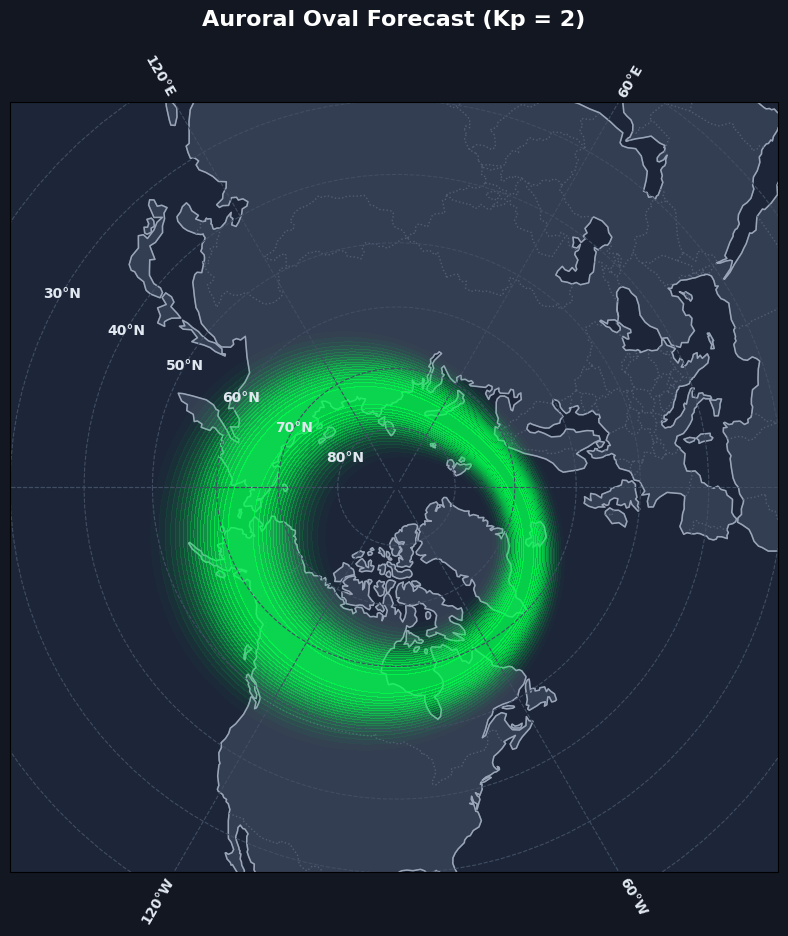

In [36]:
predicted_kp_ovalest_green()

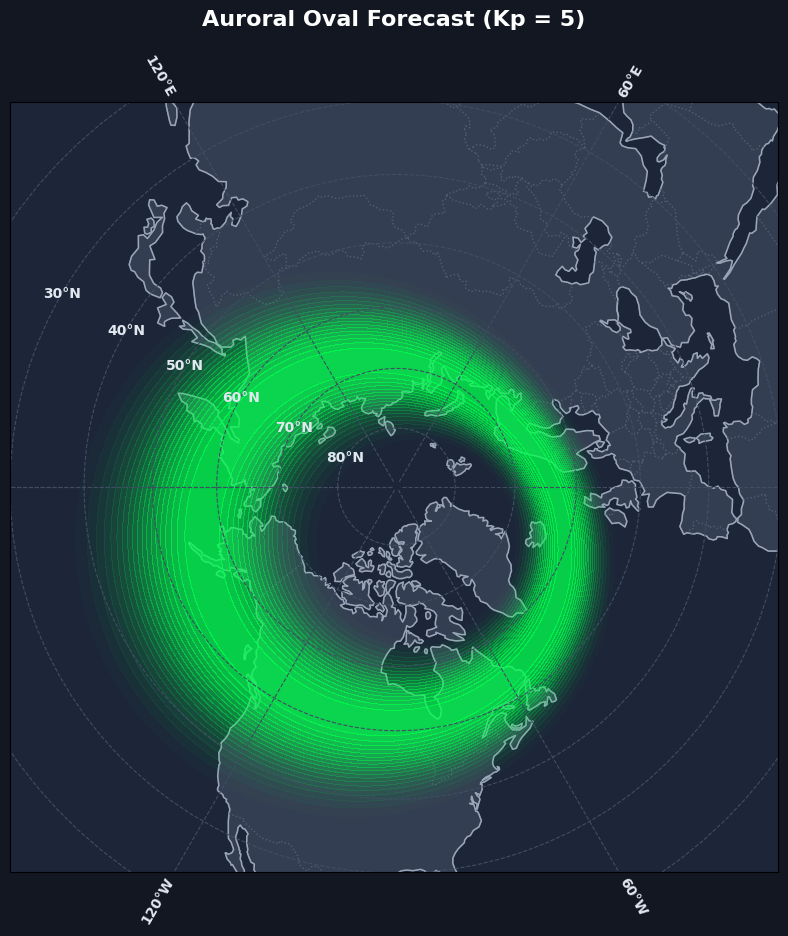

In [37]:
predicted_kp_ovalest_green(forecast_kp=5)

In [38]:
def predicted_kp_ovalest_streamlit(forecast_kp=2, solar_lon=0.0, mag_pole_lat=80.7, mag_pole_lon=-72.7, mode="dark_contrast"):
    
    base_equatorward_edge = 66.0 - (2.0 * forecast_kp)
    base_peak_lat = base_equatorward_edge + 4.0 
    
    # Create a grid of geographic latitudes and longitudes
    lons = np.linspace(-180, 180, 360)
    lats = np.linspace(30, 90, 180) 
    lon2d, lat2d = np.meshgrid(lons, lats)
    
    # Convert Geographic to Magnetic Latitude
    phi = np.radians(lat2d)
    lam = np.radians(lon2d)
    phi0 = np.radians(mag_pole_lat)
    lam0 = np.radians(mag_pole_lon)
    
    sin_mlat = np.sin(phi) * np.sin(phi0) + np.cos(phi) * np.cos(phi0) * np.cos(lam - lam0)
    sin_mlat = np.clip(sin_mlat, -1.0, 1.0)
    mlat = np.degrees(np.arcsin(sin_mlat))
    
    # Oval "Squish" Mathematics
    day_night_lat_shift = 5.0 * np.cos(np.radians(lon2d - solar_lon))
    dynamic_peak_lat = base_peak_lat + day_night_lat_shift
    
    # thickness Scaling width grows proportionally with higher Kp values

    kp_thickness_factor = 1.0 + (0.15 * forecast_kp)  # Kp=0 -> 1.0x, Kp=5 -> 1.75x, Kp=9 -> 2.35x
    base_std_dev = 3.5 - 1.5 * np.cos(np.radians(lon2d - solar_lon))
    dynamic_std_dev = base_std_dev * kp_thickness_factor
    
    probability_grid = np.exp(-0.5 * ((mlat - dynamic_peak_lat) / dynamic_std_dev)**2)
    
    # Map Theme Styling
    if mode == "light":
        fig_bg = "#ffffff"
        ocean_bg = "#e2f1f8"
        land_bg = "#e5e7eb"
        coast_color = "#374151"
        border_color = "#9ca3af"
        grid_color = "#cbd5e1"
        label_color = "#374151"
        text_color = "#111827"
    else:  # 'dark_contrast'
        fig_bg = "#121722"
        ocean_bg = "#1c2638"
        land_bg = "#343e52"
        coast_color = "#9aa5b8"
        border_color = "#525e75"
        grid_color = "#414d63"
        label_color = "#e2e8f0"
        text_color = "#ffffff"

    # Color Map Semi-transparent green gradient
    colors = [
        (0.0, 1.0, 0.3, 0.0),     
        (0.0, 1.0, 0.3, 0.20),    
        (0.0, 1.0, 0.3, 0.50),    
        (0.0, 1.0, 0.3, 0.80)     
    ]
    aurora_cmap = LinearSegmentedColormap.from_list("aurora_green", colors)
    
    fig = plt.figure(figsize=(10, 10))
    fig.patch.set_facecolor(fig_bg) 
    
    ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=-90))
    ax.set_facecolor(ocean_bg)
    
    ax.add_feature(cfeature.OCEAN, facecolor=ocean_bg)
    ax.add_feature(cfeature.LAND, facecolor=land_bg, edgecolor=border_color)
    ax.add_feature(cfeature.COASTLINE, edgecolor=coast_color, linewidth=1.1)
    ax.add_feature(cfeature.BORDERS, linestyle=":", edgecolor=border_color)
    
    ax.set_extent([-180, 180, 30, 90], crs=ccrs.PlateCarree())
    
    contour = ax.contourf(
        lon2d, lat2d, probability_grid, 
        levels=np.linspace(0.1, 1.0, 20),
        cmap=aurora_cmap, 
        transform=ccrs.PlateCarree(), 
        zorder=2
    )
    
    #Styling
    gl.xlabel_style = {"color": label_color, "size": 10, "weight": "bold"}
    gl.ylabel_style = {"color": label_color, "size": 10, "weight": "bold"}

    plt.title(
        f"Auroral Oval Forecast (Kp = {forecast_kp})",
        fontsize=16,
        pad=20,
        fontweight="bold",
        color=text_color,
    )

    # Change plt.show() to return fig
    return fig


In [39]:
predicted_kp_ovalest_streamlit

<function __main__.predicted_kp_ovalest_streamlit(forecast_kp=2, solar_lon=0.0, mag_pole_lat=80.7, mag_pole_lon=-72.7, mode='dark_contrast')>

In [40]:
def predicted_kp_ovalest_streamlit(forecast_kp=2, solar_lon=0.0, mag_pole_lat=80.7, mag_pole_lon=-72.7, mode="dark_contrast", target_lat=None, target_lon=None, location_name=None):
    
    #base_equatorward_edge = 66.0 - (2.0 * forecast_kp)
    #base_peak_lat = base_equatorward_edge + 4.0 
    #make more accurate
    
    base_equatorward_edge = 70.5 - (2.3 * forecast_kp) #67.5
    base_peak_lat = base_equatorward_edge + 3.5
    
    # Create a grid of geographic latitudes and longitudes
    lons = np.linspace(-180, 180, 360)
    lats = np.linspace(30, 90, 180) 
    lon2d, lat2d = np.meshgrid(lons, lats)
    
    # Convert Geographic to Magnetic Latitude
    phi = np.radians(lat2d)
    lam = np.radians(lon2d)
    phi0 = np.radians(mag_pole_lat)
    lam0 = np.radians(mag_pole_lon)
    
    sin_mlat = np.sin(phi) * np.sin(phi0) + np.cos(phi) * np.cos(phi0) * np.cos(lam - lam0)
    sin_mlat = np.clip(sin_mlat, -1.0, 1.0)
    mlat = np.degrees(np.arcsin(sin_mlat))
    
    # Oval "Squish" Mathematics
    day_night_lat_shift = 4.0 * np.cos(np.radians(lon2d - solar_lon)) #was 5.0 befroe
    dynamic_peak_lat = base_peak_lat + day_night_lat_shift
    
    
    # thickness Scaling width grows proportionally with higher Kp values

    #kp_thickness_factor = 1.0 + (0.15 * forecast_kp)  # Kp=0 -> 1.0x, Kp=5 -> 1.75x, Kp=9 -> 2.35x
    #base_std_dev = 3.5 - 1.5 * np.cos(np.radians(lon2d - solar_lon))
    #dynamic_std_dev = base_std_dev * kp_thickness_factor
    #make a bit tighter
    base_std_dev = 1.8 - 0.5 * np.cos(np.radians(lon2d - solar_lon))
    kp_thickness_factor = 1.0 + (0.12 * forecast_kp)
    dynamic_std_dev = base_std_dev * kp_thickness_factor
    
    probability_grid = np.exp(-0.5 * ((mlat - dynamic_peak_lat) / dynamic_std_dev)**2)
    
    cos_diff = np.cos(np.radians(lon2d - solar_lon))

    # Dynamic Peak Center (Teardrop shape: +5° dayside, -5° nightside)
    base_peak_lat = 70.0 - (1.2 * forecast_kp) #68.0 larger is smaller diam
    dynamic_peak_lat = base_peak_lat + (5.0 * cos_diff)

    # Thickness scaling factor (thin dayside arc, broader nightside)
    thickness_scale = 1.0 - 0.40 * cos_diff

    # Slim, controlled widths for inner/outer fades
    equatorward_std = (1.2 + 0.30 * forecast_kp) * thickness_scale
    poleward_std = (1.5 + 0.35 * forecast_kp) * thickness_scale
    plateau_width = (1.5 * forecast_kp) * thickness_scale #originally 0.5, change to 1 or 1.5 to make inner oval closer to pole as kp inc

    # Distance from peak (+ is Poleward/Inside, - is Equatorward/Outside)
    delta_lat = mlat - dynamic_peak_lat

    # 1. Equatorward (Outer Edge): Slim gradient fading south into transparency
    outer_prob = np.exp(-0.5 * (delta_lat / equatorward_std) ** 2)

    # 2. Poleward (Inner Edge): Solid core plateau that transitions into a slim fade north
    shifted_inner_delta = np.maximum(0.0, delta_lat - plateau_width)
    inner_prob = np.exp(-0.5 * (shifted_inner_delta / poleward_std) ** 2)

    # Combine: Outer edge fades south, Inner edge holds solid peak before fading north
    probability_grid = np.where(delta_lat <= 0, outer_prob, inner_prob)
#new code to get probability from oval
    location_prob_pct = None
    if target_lat is not None and target_lon is not None:
        t_phi = np.radians(target_lat)
        t_lam = np.radians(target_lon)
        t_sin_mlat = np.sin(t_phi) * np.sin(phi0) + np.cos(t_phi) * np.cos(phi0) * np.cos(t_lam - lam0)
        t_mlat = np.degrees(np.arcsin(np.clip(t_sin_mlat, -1.0, 1.0)))

        t_cos = np.cos(np.radians(target_lon - solar_lon))
        t_peak_lat = (70.0 - (1.2 * forecast_kp)) + (5.0 * t_cos)
        t_delta = t_mlat - t_peak_lat
        t_scale = 1.0 - 0.40 * t_cos

        if t_delta <= 0:
            t_eq_std = (1.2 + 0.30 * forecast_kp) * t_scale
            point_prob = np.exp(-0.5 * (t_delta / t_eq_std) ** 2)
        else:
            # updated 1.5 multiplier here too
            t_plat = (1.5 * forecast_kp) * t_scale
            t_pol_std = (1.5 + 0.35 * forecast_kp) * t_scale
            t_shift = max(0.0, t_delta - t_plat)
            point_prob = np.exp(-0.5 * (t_shift / t_pol_std) ** 2)

        raw_pct = point_prob * 100.0
        location_prob_pct = raw_pct if raw_pct >= 0.1 else 0.0
    # Map Theme Styling
    if mode == "light":
        fig_bg = "#ffffff"
        ocean_bg = "#e2f1f8"
        land_bg = "#e5e7eb"
        coast_color = "#374151"
        border_color = "#9ca3af"
        grid_color = "#cbd5e1"
        label_color = "#374151"
        text_color = "#111827"
    else:  # 'dark_contrast'
        fig_bg = "#121722"
        ocean_bg = "#1c2638"
        land_bg = "#343e52"
        coast_color = "#9aa5b8"
        border_color = "#525e75"
        grid_color = "#414d63"
        label_color = "#e2e8f0"
        text_color = "#ffffff"

    # Color Map Semi-transparent green gradient
    colors = [
        (0.0, 1.0, 0.3, 0.0),     
        (0.0, 1.0, 0.3, 0.20),    
        (0.0, 1.0, 0.3, 0.50),    
        (0.0, 1.0, 0.3, 0.80)     
    ]
    aurora_cmap = LinearSegmentedColormap.from_list("aurora_green", colors)
    
    fig = plt.figure(figsize=(10, 10))
    fig.patch.set_facecolor(fig_bg) 
    
    ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=-90))
    ax.set_facecolor(ocean_bg)
    
    ax.add_feature(cfeature.OCEAN, facecolor=ocean_bg)
    ax.add_feature(cfeature.LAND, facecolor=land_bg, edgecolor=border_color)
    ax.add_feature(cfeature.COASTLINE, edgecolor=coast_color, linewidth=1.1)
    ax.add_feature(cfeature.BORDERS, linestyle=":", edgecolor=border_color)
    
    ax.set_extent([-180, 180, 30, 90], crs=ccrs.PlateCarree())
    
    contour = ax.contourf(
        lon2d, lat2d, probability_grid, 
        levels=np.linspace(0.1, 1.0, 20),
        cmap=aurora_cmap, 
        transform=ccrs.PlateCarree(), 
        zorder=2
    )
#New code, plotting location on map
    if target_lat is not None and target_lon is not None:
        ax.plot(
            target_lon, target_lat, 
            marker='o', color='#ff3366', markersize=8, 
            transform=ccrs.PlateCarree(), zorder=5
        )
    gl = ax.gridlines(draw_labels=True, dms=True, color=grid_color, linestyle="--")

    #Styling
    gl.xlabel_style = {"color": label_color, "size": 10, "weight": "bold"}
    gl.ylabel_style = {"color": label_color, "size": 10, "weight": "bold"}
#NEW CODE, commenting out other title
    title_text = f"Auroral Oval Forecast (Kp = {forecast_kp})\n{location_name}: {location_prob_pct:.1f}% Probability"
#    if location_name and location_prob_pct is not None:
 #       title_text = f"Auroral Oval Forecast (Kp = {forecast_kp})\n{location_name}: {location_prob_pct:.1f}% Probability"
  #  else:
   #     title_text = f"Auroral Oval Forecast (Kp = {forecast_kp})"
    #plt.title(
    #    f"Auroral Oval Forecast (Kp = {forecast_kp})",
    #    fontsize=16,
    #    pad=20,
    #    fontweight="bold",
    #    color=text_color,
    #)
    plt.title(title_text, fontsize=15, pad=15, fontweight="bold", color=text_color)

    # Change plt.show() to return fig
    #return fig
    plt.show()

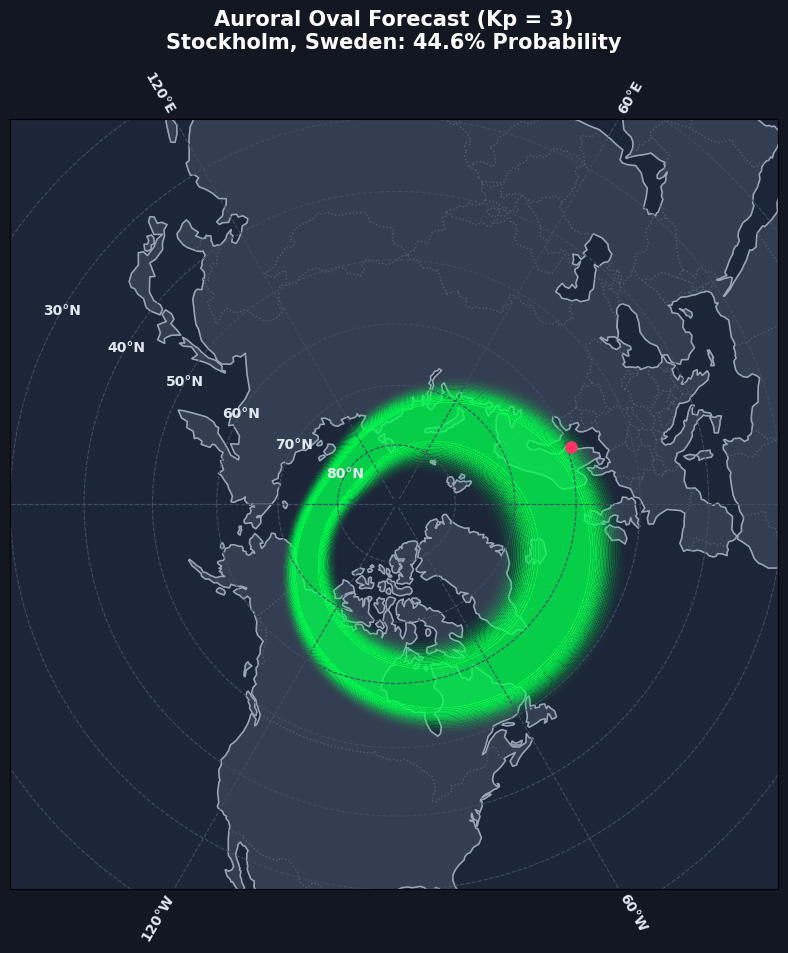

In [41]:
LOCATIONS = {
    "Tromsø, Norway": (69.65, 18.96),
    "Stockholm, Sweden": (59.33, 18.07),
    "Reykjavík, Iceland": (64.15, -21.94),
    "Fairbanks, Alaska": (64.84, -147.72),
    "Yellowknife, Canada": (62.45, -114.37),
    "Rovaniemi, Finland": (66.50, 25.73),
    "Longyearbyen, Svalbard": (78.22, 15.63)
}

selected_location_name = "Stockholm, Sweden"
target_lat, target_lon = LOCATIONS[selected_location_name]

predicted_kp_ovalest_streamlit(
    forecast_kp=3,
    solar_lon=180.0,
    mag_pole_lat=80.7,
    mag_pole_lon=-72.7,
    mode="dark_contrast",
    target_lat=target_lat,
    target_lon=target_lon,
    location_name=selected_location_name
)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=4a18bf7d-431c-4909-af8a-a54a62228a78' target="_blank">

Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>